# Analysis of mouse single cell hematopoietic populations - Analysis of single cells using SCANPY

__Author__: Elisabeth F. Heuston

## Purpose

Single cell transcriptional and clustering analysis of LSK, CMP, MEP, and GMP data presented in Heuston et al., 2021  

This notebook contains the workflow to analyze data from Scanpy-derived analyses and pertains to:
* Figures 3 and 4
* Supplemental Figures 4 and 5  

Raw data for this publication are available to download from the GEO Project GSE168260 at https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE168259  

__Scanpy - Single Cell Analysis in Python__ documentation and tutorials are available at https://scanpy.readthedocs.io/en/stable/  
__anndata - Annotated Data__ documentation and tutorials are available at https://anndata.readthedocs.io/en/latest

## Workbook setup

### Import python3.7 modules

In [1]:
import numpy as np
import scanpy as sc
import scanpy.external as sce
import pandas as pd
import sys, os
import matplotlib
import matplotlib.pyplot as plt
import glob, csv, re, warnings
from pathlib import Path

### Define module settings

In [2]:
matplotlib.rcParams['figure.figsize'] = [4.83, 2.72]

sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=150, color_map='viridis')
sc.set_figure_params(scanpy = False, dpi_save=300, frameon=False, vector_friendly=True, transparent=True)

In [3]:
sc.logging.print_header()

scanpy==1.6.0 anndata==0.7.4 umap==0.3.10 numpy==1.19.1 scipy==1.5.0 pandas==1.0.5 scikit-learn==0.23.1 statsmodels==0.11.1 python-igraph==0.7.1 louvain==0.6.1 leidenalg==0.7.0


In [4]:
warnings.filterwarnings('ignore') # suppress warnings

### Set global variables

In [5]:
working_dir = './scRNAanalysis_Scanpy/'
singleCell_dir = os.path.join('CellrangerFiles')
base_title = "scRNAanalysis"
number_neighbors = 20

In [6]:
os.chdir(working_dir) # set working directory

## Create anndata object

For this analysis Scanpy requires matrix, gene, and barcode files generated by cellranger2.0.0  
Later version of cellranger use a different folder structure that can be specified at the first line of each cell

### Load single cell data

In [7]:
meppath=os.path.join(singleCell_dir, 'MEP/outs/filtered_gene_bc_matrices/mm10/')

mepdata = sc.read(meppath + 'matrix.mtx', cache = True).T #transpose the data
mepdata.var_names = pd.read_csv(meppath + 'genes.tsv', header = None, sep = '\t')[1]
mepdata.obs_names = pd.read_csv(meppath +'barcodes.tsv', header = None)[0]
mepdata.var_names_make_unique()
mepdata.obs['orig_ident'] = 'MEP'

... reading from cache file cache/CellrangerFiles-MEP-outs-filtered_gene_bc_matrices-mm10-matrix.h5ad


In [8]:
lskpath=os.path.join(singleCell_dir, 'LSK/outs/filtered_gene_bc_matrices/mm10/')

lskdata = sc.read(lskpath + 'matrix.mtx', cache = True).T #transpose the data
lskdata.var_names = pd.read_csv(lskpath + 'genes.tsv', header = None, sep = '\t')[1]
lskdata.obs_names = pd.read_csv(lskpath +'barcodes.tsv', header = None)[0]
lskdata.var_names_make_unique()
lskdata.obs['orig_ident'] = 'LSK'

... reading from cache file cache/CellrangerFiles-LSK-outs-filtered_gene_bc_matrices-mm10-matrix.h5ad


In [9]:
cmppath=os.path.join(singleCell_dir, 'CMP/outs/filtered_gene_bc_matrices/mm10/')

cmpdata = sc.read(cmppath + 'matrix.mtx', cache = True).T #transpose the data
cmpdata.var_names = pd.read_csv(cmppath + 'genes.tsv', header = None, sep = '\t')[1]
cmpdata.obs_names = pd.read_csv(cmppath +'barcodes.tsv', header = None)[0]
cmpdata.var_names_make_unique()
cmpdata.obs['orig_ident'] = 'CMP'

... reading from cache file cache/CellrangerFiles-CMP-outs-filtered_gene_bc_matrices-mm10-matrix.h5ad


In [10]:
gmppath=os.path.join(singleCell_dir, 'GMP/outs/filtered_gene_bc_matrices/mm10/')

gmpdata = sc.read(gmppath + 'matrix.mtx', cache = True).T #transpose the data
gmpdata.var_names = pd.read_csv(gmppath + 'genes.tsv', header = None, sep = '\t')[1]
gmpdata.obs_names = pd.read_csv(gmppath +'barcodes.tsv', header = None)[0]
gmpdata.var_names_make_unique()
gmpdata.obs['orig_ident'] = 'GMP'

... reading from cache file cache/CellrangerFiles-GMP-outs-filtered_gene_bc_matrices-mm10-matrix.h5ad


### Create concatenated object

In [11]:
msdata = lskdata.concatenate([cmpdata, mepdata, gmpdata])

## Read filtering and quality control

In [12]:
sc.pp.filter_cells(msdata, min_genes=900)
msdata = msdata[msdata.obs['n_genes'] < 4500, :]
sc.pp.filter_genes(msdata, min_cells=3)

filtered out 26 cells that have less than 900 genes expressed
filtered out 10894 genes that are detected in less than 3 cells


Trying to set attribute `.var` of view, copying.


In [13]:
mito_genes = [name for name in msdata.var_names if name.startswith('mt-')]
msdata.obs['percent_mito'] = np.sum(msdata[:, mito_genes].X, axis=1).A1/np.sum(msdata.X, axis=1).A1
msdata.obs['n_counts'] = msdata.X.sum(axis=1).A1

... storing 'orig_ident' as categorical


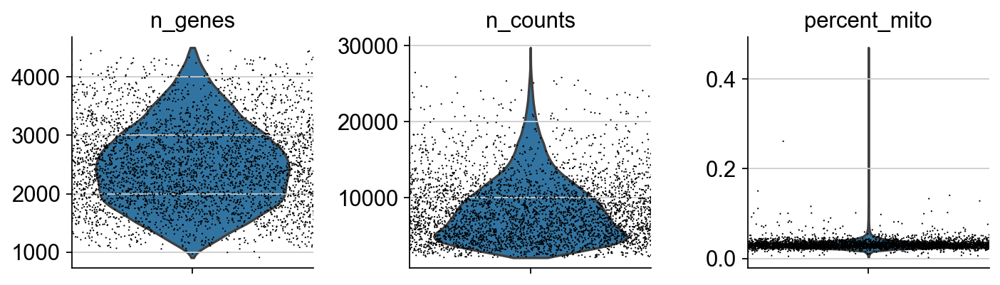

In [14]:
sc.pl.violin(msdata, ['n_genes', 'n_counts', 'percent_mito'], jitter = 5, multi_panel = True)

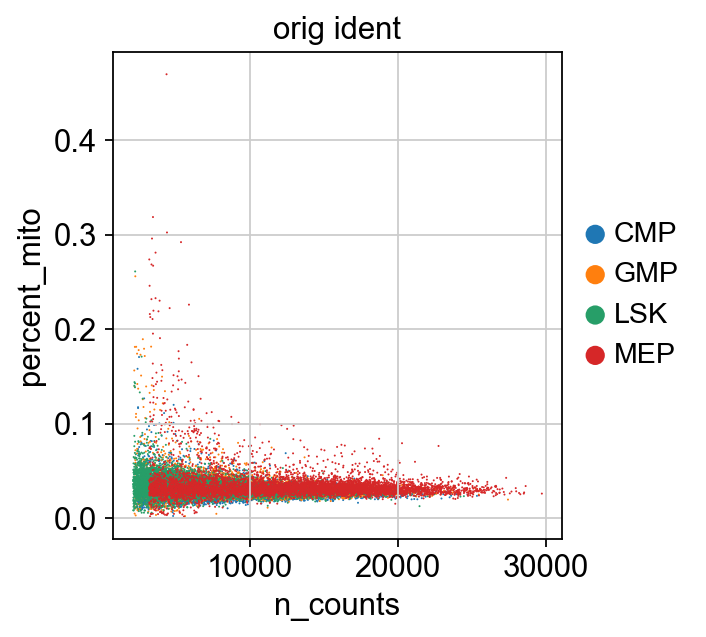

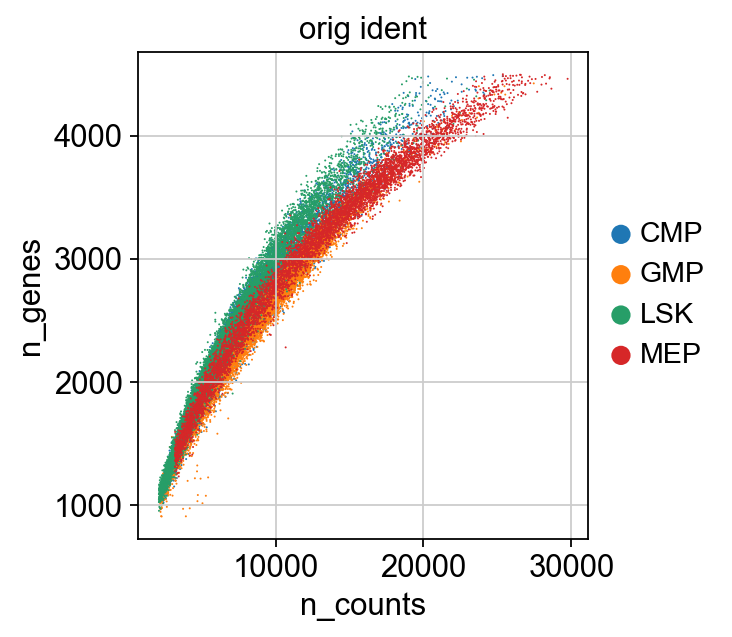

In [15]:
sc.pl.scatter(msdata, x = 'n_counts', y = 'percent_mito', color= 'orig_ident')
sc.pl.scatter(msdata, x = 'n_counts', y = 'n_genes', color= 'orig_ident')

In [16]:
msdata.raw = sc.pp.log1p(msdata, copy = True)

In [17]:
sc.pp.normalize_per_cell(msdata, counts_per_cell_after=1e4)

normalizing by total count per cell
    finished (0:00:01): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


extracting highly variable genes
    finished (0:00:01)


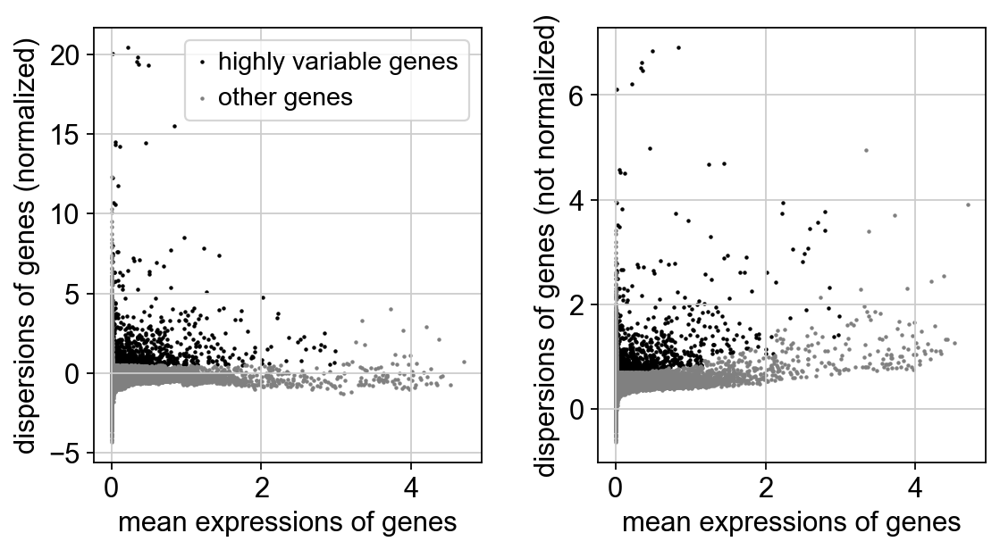

In [18]:
filter_result = sc.pp.filter_genes_dispersion(msdata.X, min_mean = 0.0125, max_mean = 3, min_disp=0.5)
sc.pl.filter_genes_dispersion(filter_result)

In [19]:
#save filtered high-dispersion msdata subset as msdata
msdata = msdata[:,filter_result.gene_subset]

In [20]:
sc.pp.log1p(msdata)

In [21]:
sc.pp.regress_out(msdata, ['n_counts', 'n_genes']) # Match regression parameters used in Seurat

regressing out ['n_counts', 'n_genes']
    sparse input is densified and may lead to high memory use
    finished (0:00:19)


In [22]:
sc.pp.scale(msdata, max_value = 10)

## Dimensional reduction

### PCA

In [23]:
sc.tl.pca(msdata, n_comps=50) # PCA required for FDG

computing PCA
    with n_comps=50
    finished (0:00:07)


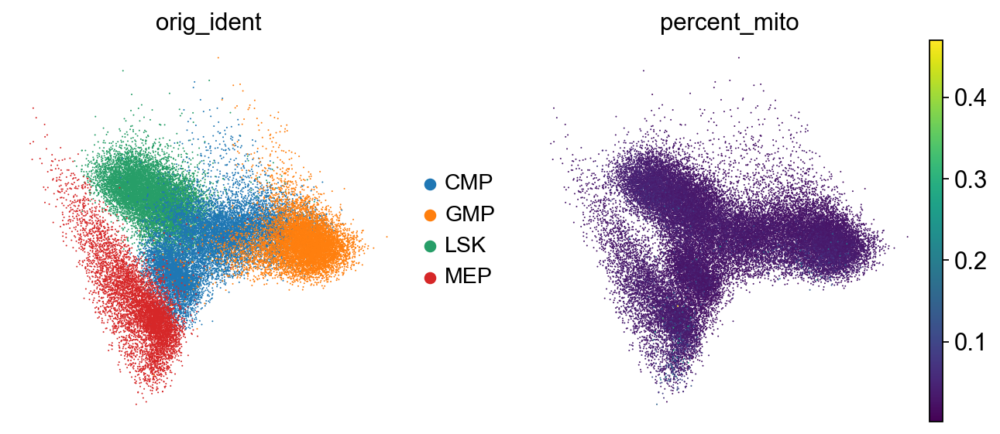

In [24]:
sc.pl.pca_scatter(msdata, color = ['orig_ident', 'percent_mito'])

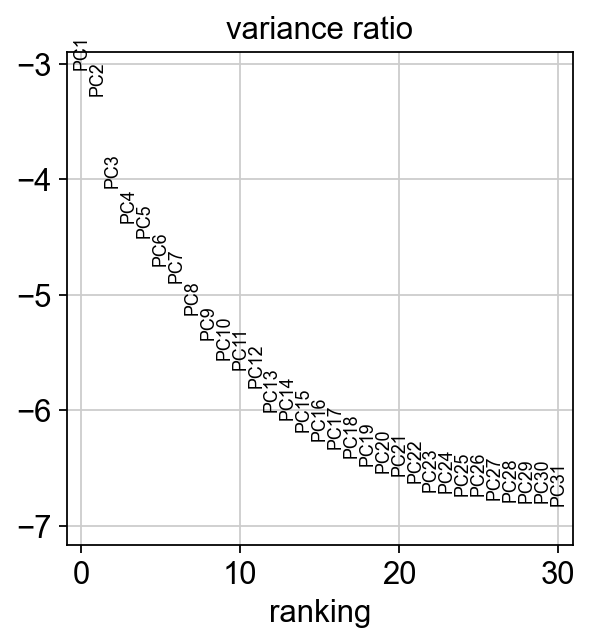

In [25]:
sc.pl.pca_variance_ratio(msdata, log = True)

### Neighborhood analysis

In [26]:
sc.pp.neighbors(msdata, n_neighbors=number_neighbors)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:14)


In [27]:
sc.tl.diffmap(msdata, n_comps = 19)

computing Diffusion Maps using n_comps=19(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.997085   0.9964205  0.99438626 0.98953426 0.98622143
     0.9850626  0.9844408  0.97994506 0.97685987 0.97469145 0.9726341
     0.97093254 0.96555126 0.9638989  0.9620172  0.96000975 0.9579932
     0.95639884]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:01)


In [28]:
sc.pp.neighbors(msdata, n_neighbors = number_neighbors, use_rep = 'X_diffmap') # recalculate neighborhood using diffusion maps

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:05)


### Force-directed graph

Overlay sorted cell identities and gene expression profiles

In [29]:
sc.tl.draw_graph(msdata)

drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:04:11)


####  Figure3A

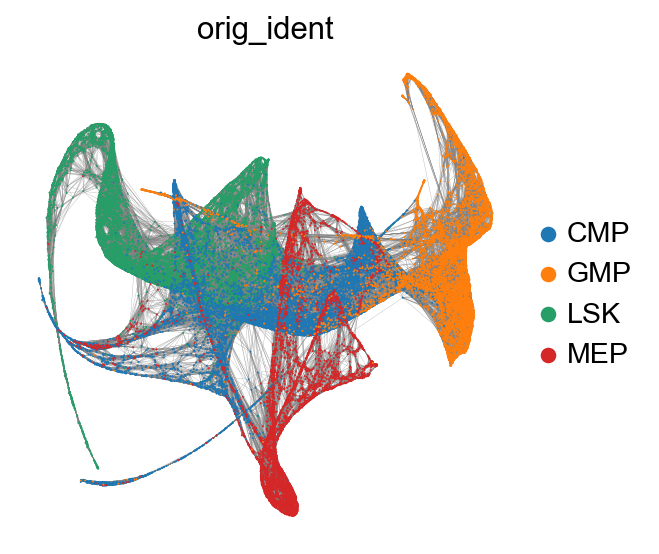

In [30]:
sc.pl.draw_graph(msdata, color = 'orig_ident', edges = True, save = base_title + 'Figure3A.png')

#### Figure 3B

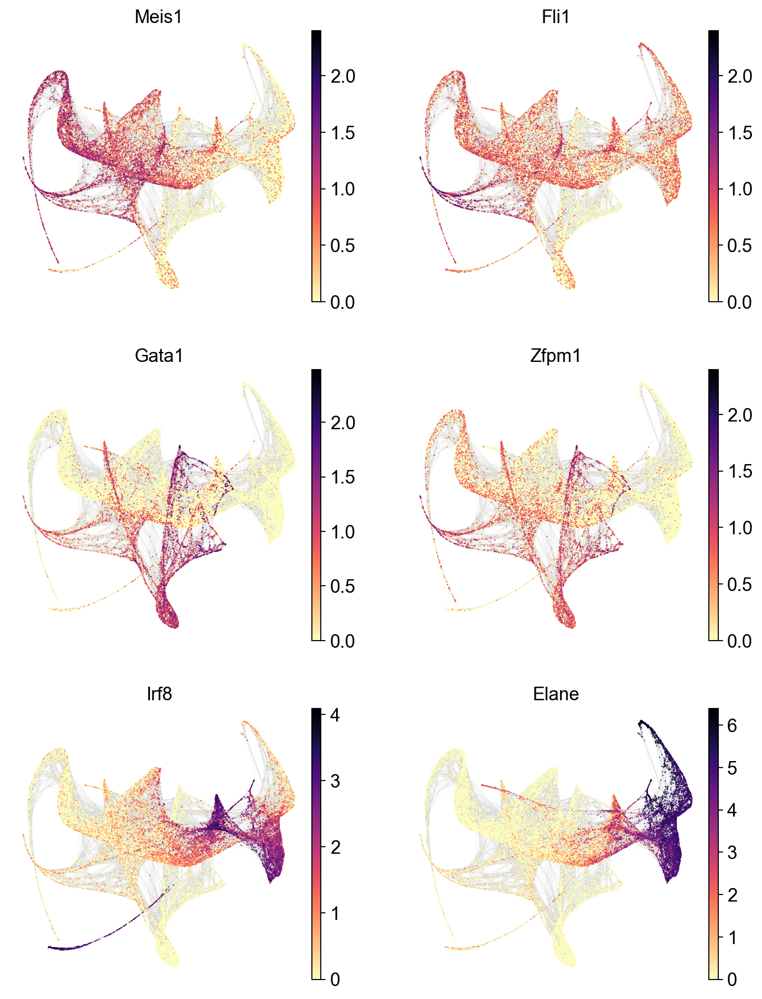

In [31]:
sc.set_figure_params(scanpy = False, dpi_save=300, frameon=False, vector_friendly=True, transparent=True)
gene_set = ['Meis1', 'Fli1', 'Gata1',
            'Zfpm1', 'Irf8', 'Elane']
sc.pl.draw_graph(msdata, color = gene_set, edges = True, edges_width = 0.1, frameon=False, edges_color="#D7D7D7", color_map='magma_r', ncols=2, save='_'.join((base_title, 'Figure3B.png')))


#### Supplemental Figure 4

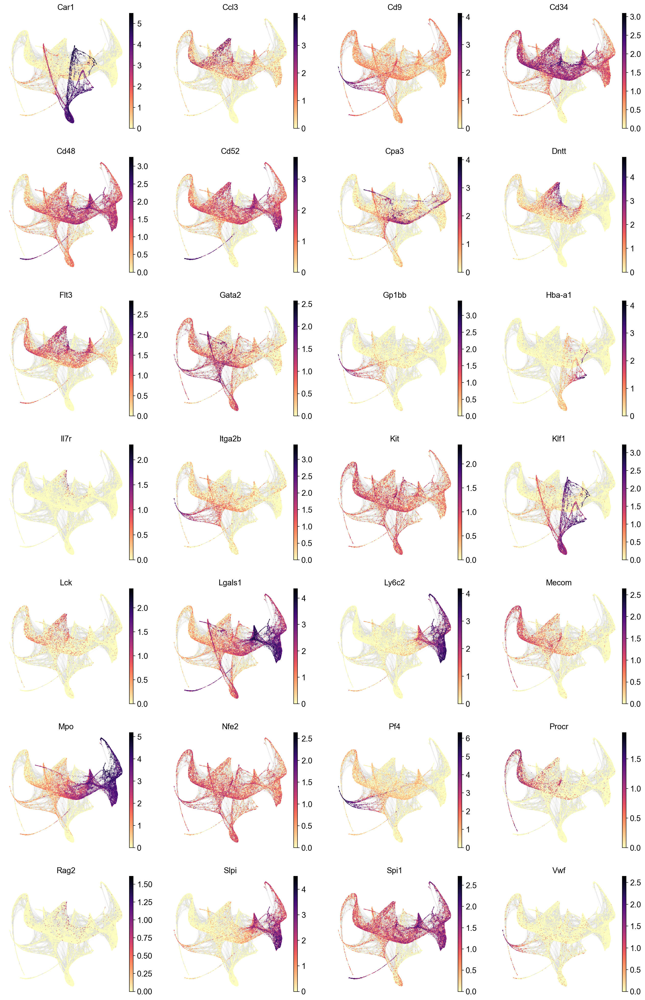

In [32]:
gene_set = ['Car1', 'Ccl3', 'Cd9', 'Cd34', 'Cd48',
            'Cd52', 'Cpa3', 'Dntt', 'Flt3', 'Gata2', 'Gp1bb',
            'Hba-a1', 'Il7r', 'Itga2b', 'Kit', 'Klf1', 'Lck',
            'Lgals1', 'Ly6c2', 'Mecom', 'Mpo', 'Nfe2',
            'Pf4', 'Procr', 'Rag2', 'Slpi', 'Spi1', 'Vwf'
           ]
sc.pl.draw_graph(msdata, color = gene_set, edges = True, edges_width = 0.1, frameon=False, edges_color="#D7D7D7", color_map='magma_r', ncols=4, save = '_'.join((base_title, 'SF4.png')))


### Overlay Seurat cluster IDs

#### Import cellids from seurat

Download and unzip __SingleCellClusterIDs__ 

In [33]:
os.chdir('SingleCellClusterIDs')
clusterList = [x for x in os.listdir() if x.endswith('.txt')]
clusterList[0:2]

['cluster_16.txt', 'cluster_17.txt']

In [35]:
prefixMap = {}
prefixMap['LSK_'] = '-1-0'
prefixMap['CMP_'] = '-1-1'
prefixMap['MEP_'] = '-1-2'
prefixMap['GMP_'] = '-1-3'

for clusterFile in clusterList:
    clusterID = re.split('\.txt', clusterFile)[0]
    with open (clusterFile, 'r', newline='\n') as f:
        reader = csv.reader(f)
        for row in reader:
            scanpyIndex = row[0][4:] + prefixMap[row[0][:4]]
            if (msdata.obs.index == scanpyIndex).any():
                msdata.obs.loc[scanpyIndex, 'SeuratClusterID'] = clusterID

In [36]:
os.chdir('../')

In [37]:
msdata.obs.head()

,orig_ident,batch,n_genes,percent_mito,n_counts,SeuratClusterID
AAACATACCGACAT-1-0,LSK,0,1578,0.047240,3768.0,cluster_6
AAACATACCTAAGC-1-0,LSK,0,1285,0.017686,2714.0,cluster_2
AAACATACGAAACA-1-0,LSK,0,2530,0.034800,7385.0,cluster_2
AAACATACGATACC-1-0,LSK,0,3157,0.031831,10964.0,cluster_6
AAACATACGTAGGG-1-0,LSK,0,2193,0.031717,5423.0,cluster_0


In [38]:
SeuratColourPalette = [
  "#cb4bbe", # cluster_0
  "#87CEF9", # cluster_1
  "#5F5F5F", # cluster_2
  "#53ba48", # cluster_3
  "#FCE4B5", # cluster_4
  "#dcca44", # cluster_5
  "#502d70", # cluster_6
  "#afd671", # cluster_7
  "#cb4471", # cluster_8
  "#69da99", # cluster_9
  "#d44732", # cluster_10
  "#6fd3cf", # cluster_11
  "#5d2539", # cluster_12
  "#cfd0a0", # cluster_13
  "#1F33FE", # cluster_14
  "#d2883b", # cluster_15
  "#6793c0", # cluster_16
  "#898938", # cluster_17
  "#c98ac2", # cluster_18
  "#FDFB03", # cluster_19
  "#c4c0cc", # cluster_20
  "#7d3d23", # cluster_21
  "#00a5ff", # cluster_22
  "#d68d7a", # cluster_23
  "#a2c1a3", # cluster_24
  "#000000", # cluster_25
  "#008000", # cluster_26
  "#00FF00", # cluster_27
  "#000080", # cluster_28
  "#515252", # cluster_29
  "#80FF80", # cluster_30
  "#8000FF", # cluster_31
  "#8080FF" # cluster_32
    ]

#### Supplemental Figure 5

... storing 'SeuratClusterID' as categorical


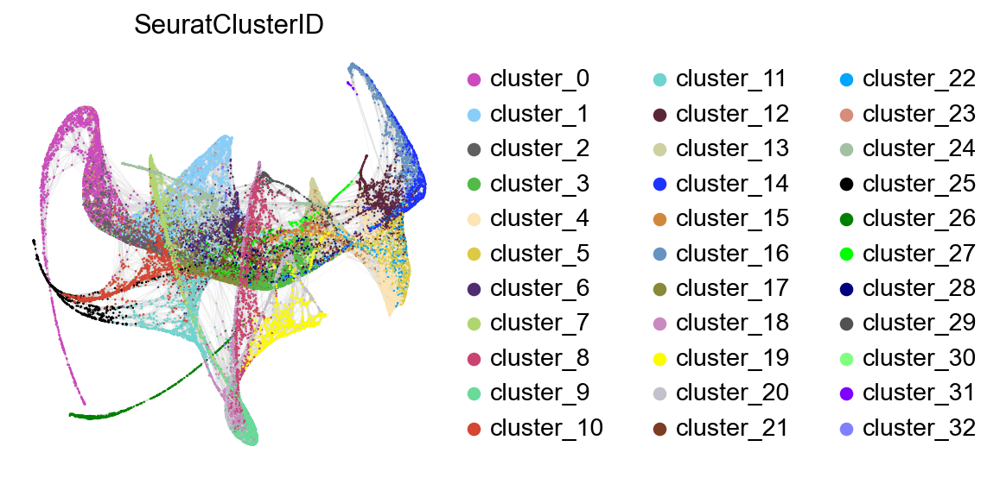

In [39]:
sc.pl.draw_graph(msdata, color = ['SeuratClusterID'], edges_width=0.1, edges_color="#D7D7D7", edges=True, legend_loc='right margin', size = 5, frameon=False, palette=SeuratColourPalette)

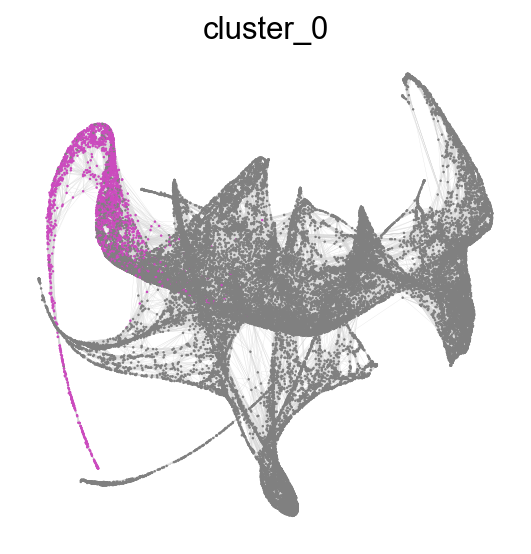

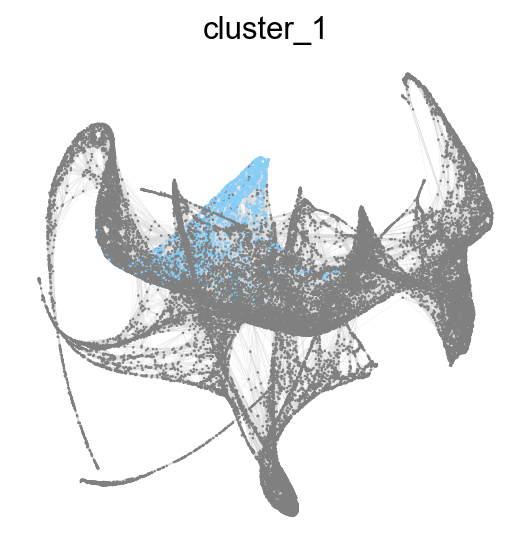

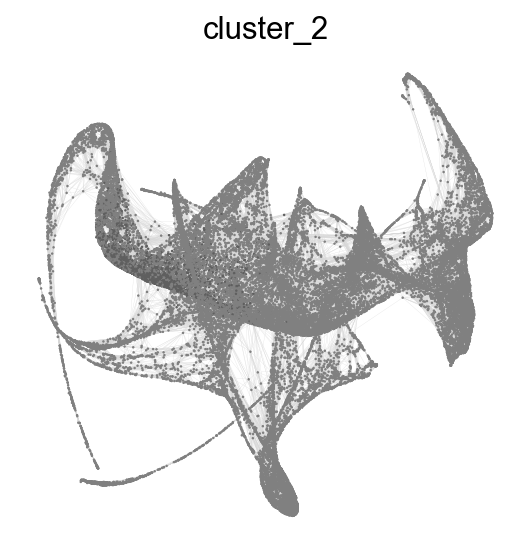

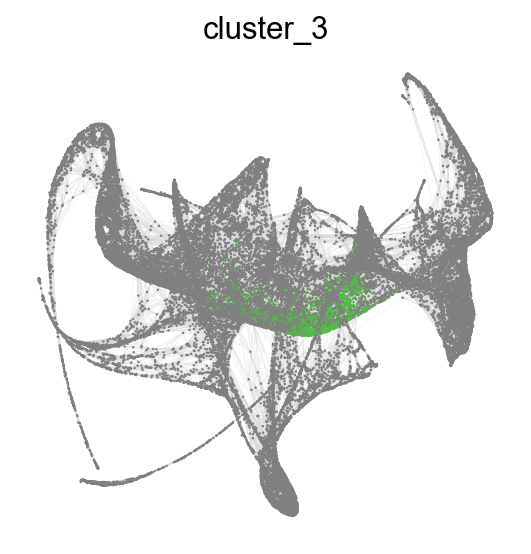

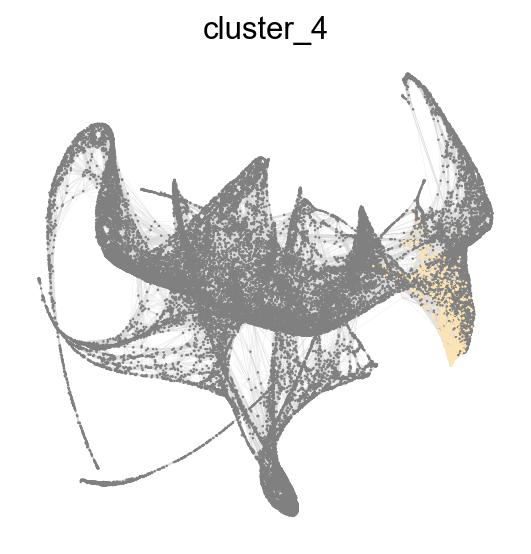

...

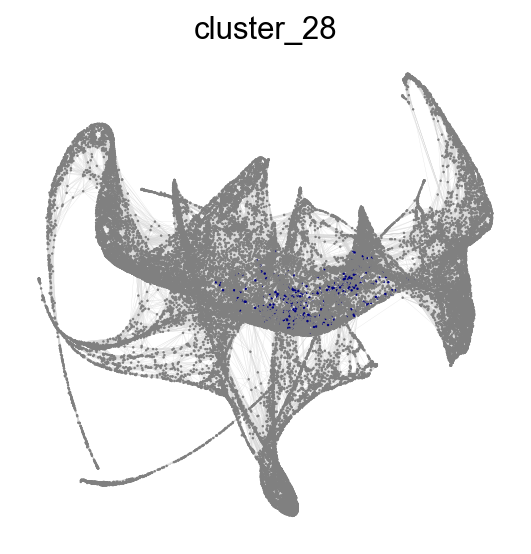

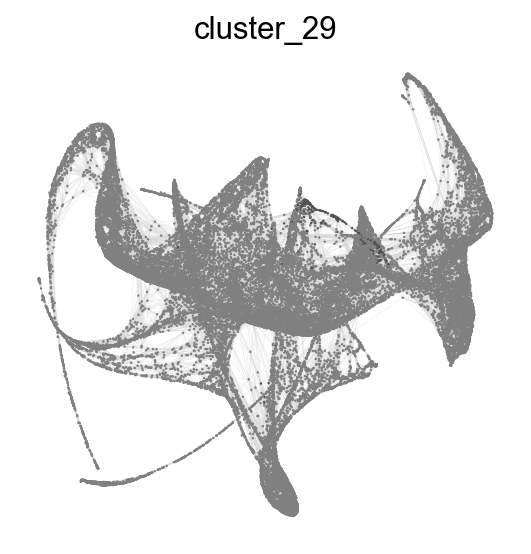

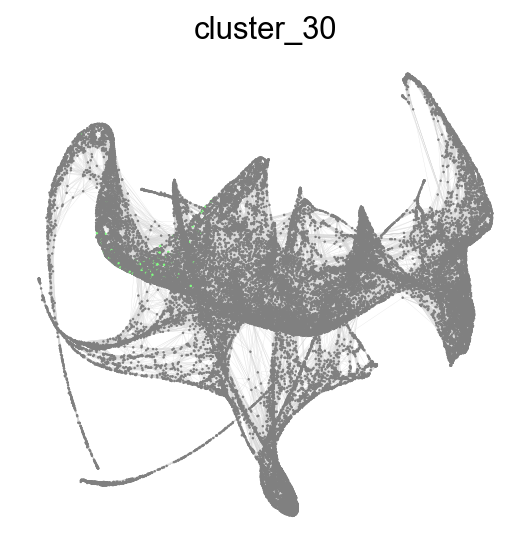

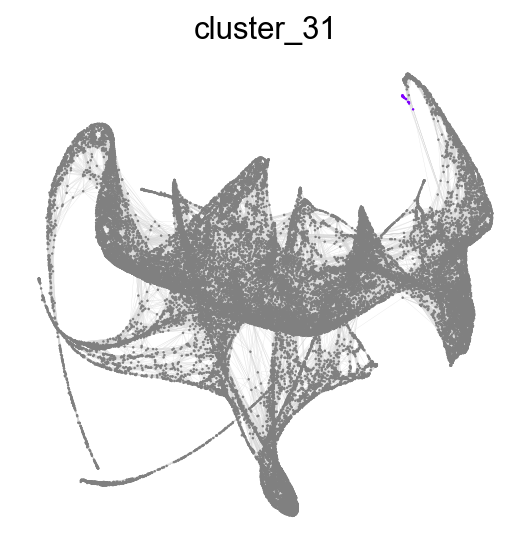

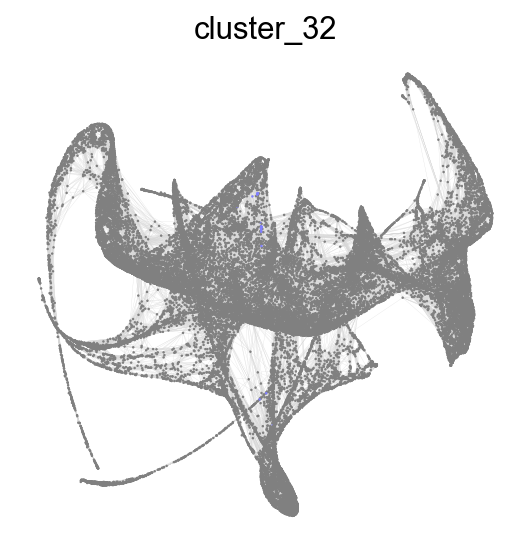

In [40]:
for i in range(0, 33):
    clusterEmphasisPalette = ['gray']* 33
    clusterEmphasisPalette[i] = SeuratColourPalette[i]
    out_file = '-seuratCluster' + str(i) + '_ScanpyOverlay.png'
    sc.pl.draw_graph(msdata, color = ['SeuratClusterID'], edges_width=0.1, edges=True, edges_color="#D7D7D7", legend_loc='none', size = 5, frameon=False, palette=clusterEmphasisPalette, title='_'.join(['cluster', str(i)]), save=out_file)

#### Figure 3C

In [41]:
cluster_colors = []

cluster_list = [0, 6, 10, 11, 17, 3]


for n, i in enumerate(clusterEmphasisPalette):
    clusterEmphasisPalette = ['gray']* 33
    for n in cluster_list:
        clusterEmphasisPalette[n] = SeuratColourPalette[0]
        cluster_colors.append(clusterEmphasisPalette)

## CMP partition-based graph abstraction (PAGA)

### Subset concatenated anndata object

In [42]:
cmp_subset = msdata[msdata.obs['orig_ident'] == 'CMP']
cmp_subset.obs['orig_ident'].unique() # confirm object contains only CMP ids

[CMP]
Categories (1, object): [CMP]

### Run PAGA on CMP subset

In [43]:
sc.tl.paga(cmp_subset, groups='SeuratClusterID')

running PAGA


Trying to set attribute `.uns` of view, copying.


    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)


In [44]:
cmp_subset.obs.head()

,orig_ident,batch,n_genes,percent_mito,n_counts,SeuratClusterID
AAACATACAAGCCT-1-1,CMP,1,1223,0.024156,2608.0,cluster_11
AAACATACACCCTC-1-1,CMP,1,3722,0.024287,16717.0,cluster_18
AAACATACACTGTG-1-1,CMP,1,2039,0.028930,5738.0,cluster_7
AAACATACAGAAGT-1-1,CMP,1,2071,0.027330,6074.0,cluster_13
AAACATACAGAGGC-1-1,CMP,1,1849,0.027056,4657.0,cluster_17


#### Figure 4C

--> added 'pos', the PAGA positions (adata.uns['paga'])


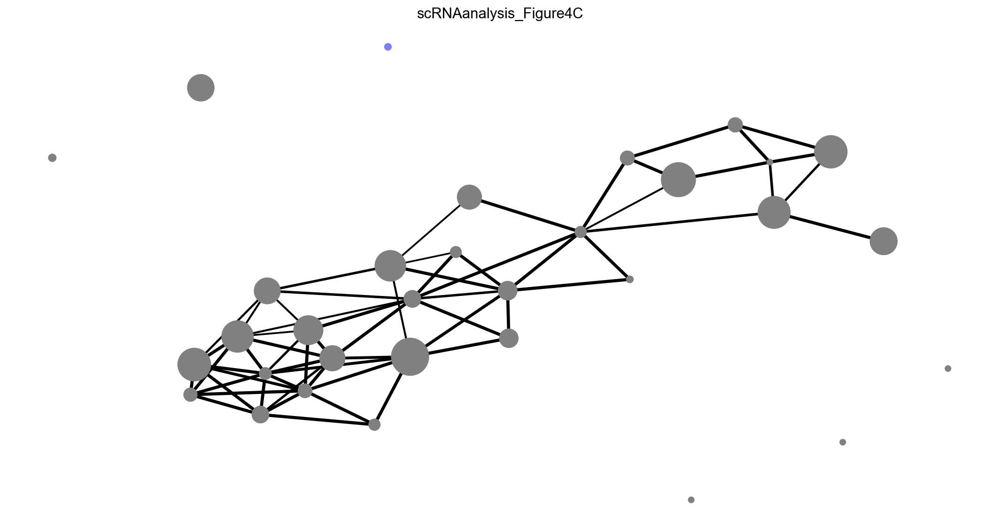

In [45]:
matplotlib.rcParams['figure.figsize'] = [14,8]
sc.pl.paga(cmp_subset, 
           color=['SeuratClusterID'], 
           labels = ['']*len(cmp_subset.obs['SeuratClusterID'].unique()),
           threshold = 0.5, 
           title = [base_title + '_Figure4C'], 
           node_size_scale=2, 
           node_size_power=0.5,
           frameon=False,
           max_edge_width=10,
           edge_width_scale = 0.4,
           save =  base_title + '_Figure4C.png'
           )

--> added 'pos', the PAGA positions (adata.uns['paga'])


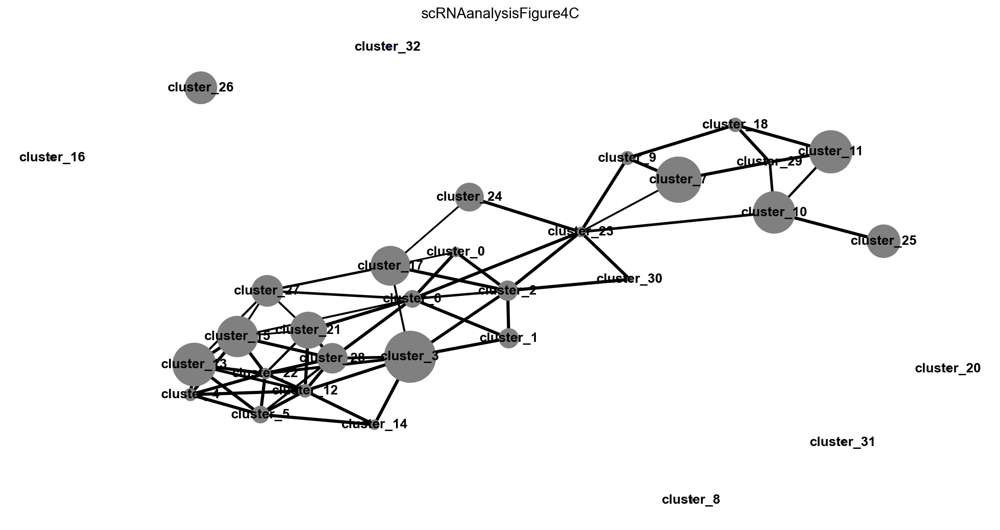

In [46]:
matplotlib.rcParams['figure.figsize'] = [14,8]
sc.pl.paga(cmp_subset, 
           color=['SeuratClusterID'], 
           threshold = 0.5, 
           title = [base_title + 'Figure4C'], 
           node_size_scale=2, 
           node_size_power=0.7,
           frameon=False,
           max_edge_width=10,
           edge_width_scale = 0.4,
           save =  base_title + '_Figure4C_labeled.png'
           )

# Session information

In [ ]:
sc.logging.print_versions()